In [37]:
import numpy as np
import pandas as pd
from scipy import stats

import matplotlib.pyplot as plt
from pylab import rcParams
plt.style.use("fivethirtyeight")

%matplotlib inline
%config InlineBackend.figure_format = "svg"
rcParams["figure.figsize"] = 5, 3


In [2]:
train_df = pd.read_csv("train.csv")

In [3]:
train_df.head(5)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,NaN,0,11,B,184966.930730
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
3,5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644


In [4]:
test_df = pd.read_csv("test.csv")

In [5]:
test_df.head(5)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
0,725,58,2.0,49.882643,33.432782,6.0,6,14.0,1972,0.310199,B,B,11,2748,1,NaN,0,0,B
1,15856,74,2.0,69.263183,NaN,1.0,6,1.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B
2,5480,190,1.0,13.597819,15.948246,12.0,2,5.0,1909,0.000000,B,B,30,7538,87,4702.0,5,5,B
3,15664,47,2.0,73.046609,51.940842,9.0,22,22.0,2007,0.101872,B,B,23,4583,3,NaN,3,3,B
4,14275,27,1.0,47.527111,43.387569,1.0,17,17.0,2017,0.072158,B,B,2,629,1,NaN,0,0,A


In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
Id               10000 non-null int64
DistrictId       10000 non-null int64
Rooms            10000 non-null float64
Square           10000 non-null float64
LifeSquare       7887 non-null float64
KitchenSquare    10000 non-null float64
Floor            10000 non-null int64
HouseFloor       10000 non-null float64
HouseYear        10000 non-null int64
Ecology_1        10000 non-null float64
Ecology_2        10000 non-null object
Ecology_3        10000 non-null object
Social_1         10000 non-null int64
Social_2         10000 non-null int64
Social_3         10000 non-null int64
Healthcare_1     5202 non-null float64
Helthcare_2      10000 non-null int64
Shops_1          10000 non-null int64
Shops_2          10000 non-null object
Price            10000 non-null float64
dtypes: float64(8), int64(9), object(3)
memory usage: 1.5+ MB


### #
Чуть больше 20% значений отсутсвует по фиче LifeSquare и почти половина по Healthcare_1.
Проанализируем каждую переменную построив гистограммы частот по количественным признакам

Text(0, 0.5, 'Price')

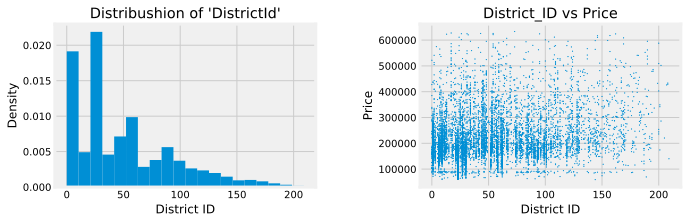

In [7]:
fig, ax = plt.subplots(nrows=1, ncols=2)
ax1, ax2 = ax
fig.subplots_adjust(wspace=0.4)
fig.set_size_inches(10, 3)

ax1.hist(train_df["DistrictId"], bins=20, density=True)
ax1.set_title("Distribushion of 'DistrictId'")
ax1.set_ylabel("Density")
ax1.set_xlabel("District ID")


ax2.scatter(train_df["DistrictId"], train_df["Price"], s=0.5)
ax2.set_title("District_ID vs Price")
ax2.set_xlabel("District ID")
ax2.set_ylabel("Price")

Как видно из правого графика основная масса наблюдений приходится на районы с ID до 100. Определенных зависимостей между районом и ценой нет. Районы с ID выше 100 представляют собой скорее всего малонаселенные районы, потому что распределение цен примерно одинаковое что в районах с высокой плотностью, что в районах с низкой плотностью. Так же четко прослеживается определенная граница на уровне 100 000. Скорее всего это представляет собой набор примерно одинаковых лотов....возможно лоты с определенными показателями, типо минимальных по размеру однушек или студий. Оценим уровень наблюдений по районам от 0 до 250 с шагом в 50.

In [8]:
j = 0
for i in range(5):
    lot_count = train_df["DistrictId"].value_counts(sort=False).sort_index()[j:j+50].sum()
    print(f"Number of lots in districts from {j} to {j+50} = {lot_count}")
    j += 50

Number of lots in districts from 0 to 50 = 5872
Number of lots in districts from 50 to 100 = 2680
Number of lots in districts from 100 to 150 = 1086
Number of lots in districts from 150 to 200 = 355
Number of lots in districts from 200 to 250 = 7


Почти 60% лотов сосредоточены в районах от 0 до 50. Скорее всего данное распределение связано с популярностью района и его плотностью населения. Скорее всего в данном случае другие фичи, описывающие социальные показатели так же зависят от конкретного района. Так же можно попробовать разбить данные по ценам на два массива и с помощью т-теста посчитать значимо различаются ли их средние

Text(0.5, 1.0, 'Price distribushion')

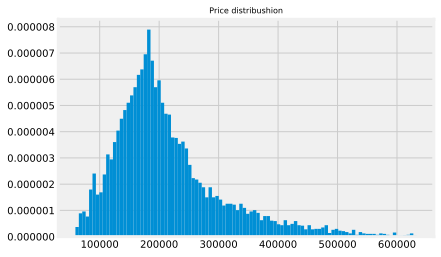

In [61]:
fig, ax = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(6,4)

ax.hist(train_df["Price"].to_numpy(), bins=100, density=True)
ax.set_title("Price distribushion", fontdict={"fontsize": 8})

Как видно распределение конечно не нормальное, но по крайней мере не имеет большое количество выбросов и сама форма приемлима.
По хорошему тут надо было бы сделать тест на нормальность, но ограничусь пока этим))

In [64]:
price_1 = train_df.loc[train_df["DistrictId"] <= 50, "Price"].to_numpy()
price_2 = train_df.loc[train_df["DistrictId"] > 50, "Price"].to_numpy()

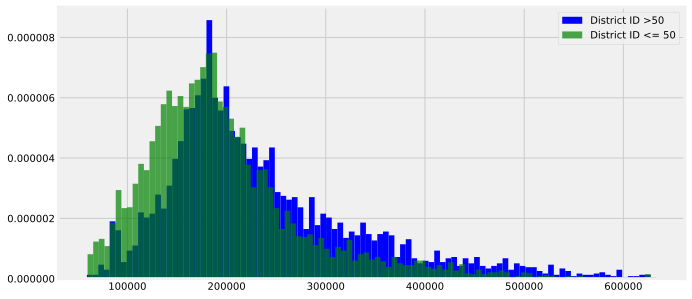

In [75]:
fig, ax = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(10,5)

ax.hist(price_2, bins=100, density=True, color="b", label="District ID >50")
ax.hist(price_1, bins=100, density=True, color="g", label="District ID <= 50", alpha=0.7)
ax.legend()

Из графика видно, что распределение кластера 1 (с районами до 50) скошено влево, а второй кластер наоборот. Скорее всего это говорит о том, что в кластере 1 присутсвует большое количество лотов схожих характеристик, которые относятся к масс-маркету. Во стором кластере придставлены районы, где наблюдается превалирование более дорогих лотов.

In [65]:
price_1.var(), price_2.var(), price_2.var() / price_1.var()

(7036977749.638955, 9992983379.90366, 1.4200674970751994)

Дисперсия по второму кластеру (где номер района больше 50) выше на 30%, поэтому применим параметр equal_var

In [54]:
stats.ttest_ind(price_1, price_2, equal_var=False)

Ttest_indResult(statistic=20.54276249695847, pvalue=2.1597118121696692e-91)

Исходя из того что получили минимальное значение р-значимости, можно отвергнуть нулевую гипотезу о равенстве средних.

Начнем проверять распределение цен в зависимсоти от районов и социальных показателей, возможно можно будет найти какие-то взаимосвязи
Начнем с показателей Ecology_1 Ecology_2 Ecology_3

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=3)
ax1, ax2, ax3 = ax
fig.subplots_adjust(wspace=0.3)
fig.set_size_inches(12,3)

ax1.hist(train_df["Ecology_1"], bins=20, density=True)
ax1.set_ylabel("Ecology_1")
ax1.set_xlabel("Density")
ax1.set_title("Ecology 1 distribushion")

ax2.scatter(train_df["DistrictId"], train_df["Ecology_1"], s=0.5)
ax2.set_ylabel("Ecology_1")
ax2.set_xlabel("District Id")
ax2.set_title("Ecology_1 vs District_ID")

ax3.scatter(train_df["Ecology_1"], train_df["Price"], s=0.1)
ax3.set_title("Ecology_1 vs Price")
ax3.set_xlabel("Ecology_1")
ax3.set_ylabel("Price")

Text(0, 0.5, 'Price')

Исходя из графиков можно сделать вывод о том что уровень показателя Ecology_1 не зависит от конкретного района. Собственно как и показатель цены не имеет какой-то ярко выраженной зависимости. Проанализируем категориальные показатели Ecology_2 и Ecology_3

In [10]:
fig, ax = plt.subplots(nrows=1, ncols=2)
ax1, ax2 = ax
fig.set_size_inches(8, 3)
fig.subplots_adjust(wspace=0.3)

ax1.scatter(train_df.loc[train_df["Ecology_2"] == "B", "DistrictId"],
            train_df.loc[train_df["Ecology_2"] == "B", "Price"],
            s=0.5, c="y", label="B")
ax1.scatter(train_df.loc[train_df["Ecology_2"] == "A", "DistrictId"],
            train_df.loc[train_df["Ecology_2"] == "A", "Price"],
            s=0.5, c="red", label="A")
ax1.legend(framealpha=0, markerscale=8)
ax1.set_xlabel("District ID")
ax1.set_ylabel("Price")
ax1.set_title("Price vs District_Id with Ecology_2", fontdict={"fontsize": 8})

ax2.scatter(train_df.loc[train_df["Ecology_3"] == "B", "DistrictId"],
            train_df.loc[train_df["Ecology_3"] == "B", "Price"],
            s=0.5, c="y", label="B")
ax2.scatter(train_df.loc[train_df["Ecology_3"] == "A", "DistrictId"],
            train_df.loc[train_df["Ecology_3"] == "A", "Price"],
            s=0.5, c="red", label="A")
ax2.legend(framealpha=0, markerscale=8)
ax2.set_title("Price vs District_Id with Ecology_3", fontdict={"fontsize": 8})
ax2.set_xlabel("District ID")
ax2.set_ylabel("Price")

Text(0, 0.5, 'Price')

Как видно из графиков переменные не сбалансированы. Граддация переменной Ecology_2 по категории А в основном распределена в одном конкретном районе. Ecology_3 так же не вносит никакой ясности в распределение цен или районов. Исходя из этого предлагаю убрать данные переменные из последующего анализа и прогнозирования. 

Проанализируем переменные Social_1, Social_2, Social_3

In [96]:
fig, ax = plt.subplots(nrows=2, ncols=2)
ax1, ax2, ax3, ax4 = ax.flatten()
fig.set_size_inches(10,10)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

ax1.hist(train_df["Social_1"].to_numpy(), bins=100, density=True)
ax1.set_title("Social_1", fontdict={"fontsize": 9})

ax2.scatter(train_df["Social_1"], train_df["Price"], s=0.5)
ax2.set_title("Social_1 vs Price", fontdict={"fontsize": 9})

ax3.hist(train_df.loc[train_df["DistrictId"] <=50, "Social_1"].to_numpy(), 
         bins=100, density=True, color="r", label="District <= 50")
ax3.hist(train_df.loc[train_df["DistrictId"] >50, "Social_1"].to_numpy(), 
         bins=100, density=True, color="g", label="District > 50", alpha=0.7)
ax3.legend()
ax3.set_title("Social_1 vs District_Id", fontdict={"fontsize": 9})

ax4.scatter(train_df.loc[train_df["DistrictId"] <=50, "Social_1"].to_numpy(),
            train_df.loc[train_df["DistrictId"] <=50, "Price"].to_numpy(), s=0.5, c="r", label="District <= 50")
ax4.scatter(train_df.loc[train_df["DistrictId"] >50, "Social_1"].to_numpy(),
            train_df.loc[train_df["DistrictId"] >50, "Price"].to_numpy(), s=0.5, c="g", label="District > 50")
ax4.legend(markerscale=9)
ax4.set_title("Social_1 vs Price and District", fontdict={"fontsize": 9})

Text(0.5, 1.0, 'Social_1 vs Price and District')

In [97]:
fig, ax = plt.subplots(nrows=2, ncols=2)
ax1, ax2, ax3, ax4 = ax.flatten()
fig.set_size_inches(10,10)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

ax1.hist(train_df["Social_2"].to_numpy(), bins=100, density=True)
ax1.set_title("Social_2", fontdict={"fontsize": 9})

ax2.scatter(train_df["Social_2"], train_df["Price"], s=0.5)
ax2.set_title("Social_2 vs Price", fontdict={"fontsize": 9})

ax3.hist(train_df.loc[train_df["DistrictId"] <=50, "Social_2"].to_numpy(), 
         bins=100, density=True, color="r", label="District <= 50")
ax3.hist(train_df.loc[train_df["DistrictId"] >50, "Social_2"].to_numpy(), 
         bins=100, density=True, color="g", label="District > 50", alpha=0.7)
ax3.legend()
ax3.set_title("Social_2 vs District_Id", fontdict={"fontsize": 9})

ax4.scatter(train_df.loc[train_df["DistrictId"] <=50, "Social_2"].to_numpy(),
            train_df.loc[train_df["DistrictId"] <=50, "Price"].to_numpy(), s=0.5, c="r", label="District <= 50")
ax4.scatter(train_df.loc[train_df["DistrictId"] >50, "Social_2"].to_numpy(),
            train_df.loc[train_df["DistrictId"] >50, "Price"].to_numpy(), s=0.5, c="g", label="District > 50")
ax4.legend(markerscale=9)
ax4.set_title("Social_2 vs Price and District", fontdict={"fontsize": 9})

Text(0.5, 1.0, 'Social_2 vs Price and District')

In [98]:
fig, ax = plt.subplots(nrows=2, ncols=2)
ax1, ax2, ax3, ax4 = ax.flatten()
fig.set_size_inches(10,10)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

ax1.hist(train_df["Social_3"].to_numpy(), bins=100, density=True)
ax1.set_title("Social_3", fontdict={"fontsize": 9})

ax2.scatter(train_df["Social_3"], train_df["Price"], s=0.5)
ax2.set_title("Social_3 vs Price", fontdict={"fontsize": 9})

ax3.hist(train_df.loc[train_df["DistrictId"] <=50, "Social_3"].to_numpy(), 
         bins=100, density=True, color="r", label="District <= 50")
ax3.hist(train_df.loc[train_df["DistrictId"] >50, "Social_3"].to_numpy(), 
         bins=100, density=True, color="g", label="District > 50", alpha=0.7)
ax3.legend()
ax3.set_title("Social_3 vs District_Id", fontdict={"fontsize": 9})

ax4.scatter(train_df.loc[train_df["DistrictId"] <=50, "Social_3"].to_numpy(),
            train_df.loc[train_df["DistrictId"] <=50, "Price"].to_numpy(), s=0.5, c="r", label="District <= 50")
ax4.scatter(train_df.loc[train_df["DistrictId"] >50, "Social_3"].to_numpy(),
            train_df.loc[train_df["DistrictId"] >50, "Price"].to_numpy(), s=0.5, c="g", label="District > 50")
ax4.legend(markerscale=9)
ax4.set_title("Social_3 vs Price and District", fontdict={"fontsize": 9})

Text(0.5, 1.0, 'Social_3 vs Price and District')